# **Project: Mercedes-Benz Greener Manufacturing**

## 1. Import Libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
% matplotlib inline
plt.style.use('fivethirtyeight')

from sklearn import preprocessing
from sklearn.decomposition import PCA, FastICA
seed =45
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import mean_squared_error as mse
from sklearn.linear_model import Ridge
from sklearn import linear_model
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.svm import SVR
from sklearn.feature_selection import RFE
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.decomposition import TruncatedSVD

##  2. Import train and test dataset

In [2]:
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')
print('Train dataset shape = ', train_df.shape)
print('Test dataset shape = ',test_df.shape)

Train dataset shape =  (4209, 378)
Test dataset shape =  (4209, 377)


In [3]:
train_df.head()

,ID,y,X0,X1,X2,X3,X4,X5,X6,X8,...,X375,X376,X377,X378,X379,X380,X382,X383,X384,X385
0,0,130.81,k,v,at,a,d,u,j,o,...,0,0,1,0,0,0,0,0,0,0
1,6,88.53,k,t,av,e,d,y,l,o,...,1,0,0,0,0,0,0,0,0,0
2,7,76.26,az,w,n,c,d,x,j,x,...,0,0,0,0,0,0,1,0,0,0
3,9,80.62,az,t,n,f,d,x,l,e,...,0,0,0,0,0,0,0,0,0,0
4,13,78.02,az,v,n,f,d,h,d,n,...,0,0,0,0,0,0,0,0,0,0


In [4]:
test_df.head()

,ID,X0,X1,X2,X3,X4,X5,X6,X8,X10,...,X375,X376,X377,X378,X379,X380,X382,X383,X384,X385
0,1,az,v,n,f,d,t,a,w,0,...,0,0,0,1,0,0,0,0,0,0
1,2,t,b,ai,a,d,b,g,y,0,...,0,0,1,0,0,0,0,0,0,0
2,3,az,v,as,f,d,a,j,j,0,...,0,0,0,1,0,0,0,0,0,0
3,4,az,l,n,f,d,z,l,n,0,...,0,0,0,1,0,0,0,0,0,0
4,5,w,s,as,c,d,y,i,m,0,...,1,0,0,0,0,0,0,0,0,0


## 3. Understanding the Dataset
> To understand the given dataset let's first check for any missing values in the dataset

In [5]:
missing_df = train_df.isnull().sum(axis=0).reset_index()
missing_df.columns = ['column_name', 'missing_count']
missing_df = missing_df.loc[missing_df['missing_count']>0]
missing_df = missing_df.sort_values(by='missing_count')
missing_df

,column_name,missing_count


> There are no missing values.
> So, now we will check for different datatypes available

> Next check for different data types present in the dataset, this will give an idea of what types of features are present

In [6]:
datatype = train_df.dtypes.reset_index()
datatype.columns = ["Count", "Column Type"]
datatype.groupby("Column Type").aggregate('count').reset_index()

,Column Type,Count
0,int64,369
1,float64,1
2,object,8


> There are **8 Categorical** Columns each representing a custom feature in a Mercedes car, **1 float** column represents the time (in seconds) that the car took to pass testing for each variable (in our case target values), **369 integer values** which indicates different tests performed on the car

> To understand the correlation between tests conducted on the car, we need to seperate the given training-dataset into train_label and train_dataset.

In [7]:
train_x = train_df.drop(['y','ID'],axis = 1)
train_y = train_df['y']

test_x = test_df.drop(['ID'], axis = 1)

print('Train dataset shape = ', train_x.shape)
print('Train labels shape = ', train_y.shape)
print('Test dataset shape = ', test_x.shape)

Train dataset shape =  (4209, 376)
Train labels shape =  (4209,)
Test dataset shape =  (4209, 376)


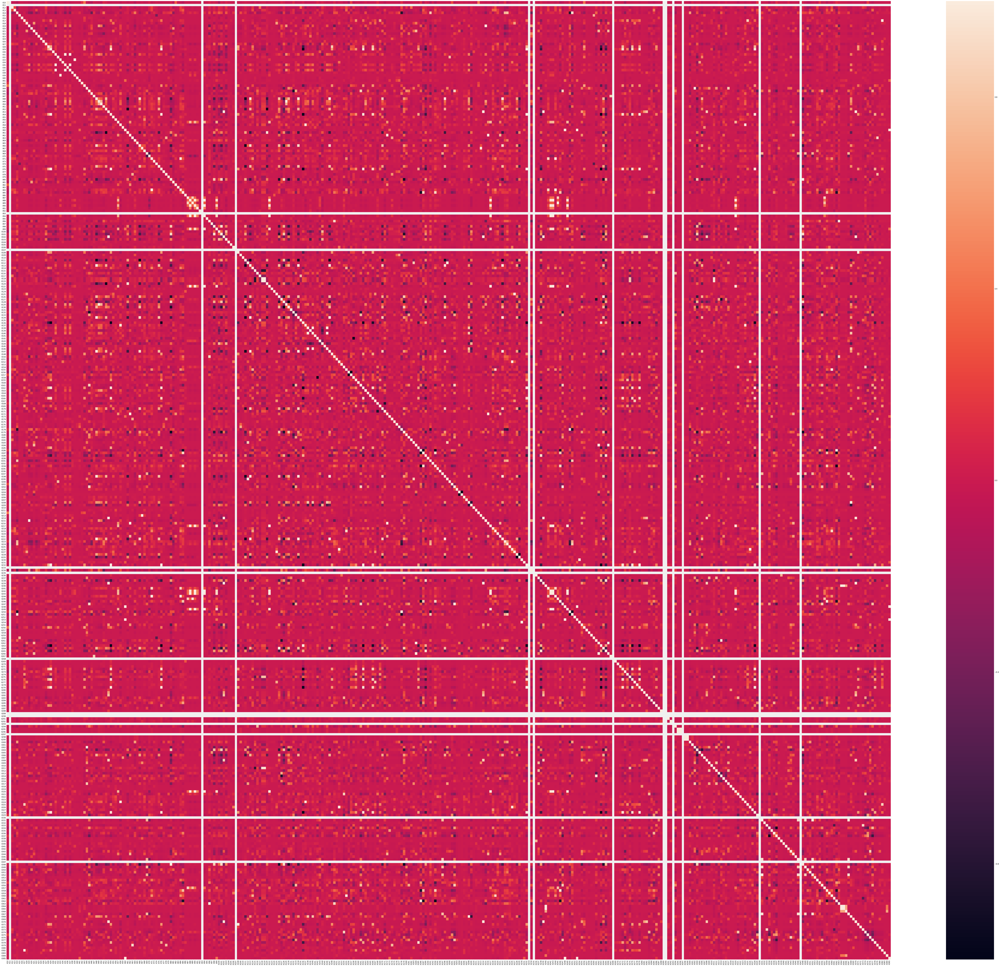

In [8]:
plt.figure(figsize=(100,100))
sns.heatmap(train_x.corr())

> From above correlation plot we can observe that there are few tests, which are represented in white line, that have not been conducted for any type of vehicles. To know these few tests, lets find the correlation matrix and identify the corresponding column numbers

In [9]:
train_x.corr()

,X10,X11,X12,X13,X14,X15,X16,X17,X18,X19,...,X375,X376,X377,X378,X379,X380,X382,X383,X384,X385
X10,1.000000,NaN,-0.033084,-0.028806,-0.100474,-0.002532,-0.005944,-0.010164,-0.010323,-0.038610,...,0.165277,-0.028618,-0.074244,-0.016870,-0.011374,-0.010479,-0.010164,-0.004740,-0.002532,-0.004387
X11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
X12,-0.033084,NaN,1.000000,0.214825,-0.246513,-0.006212,-0.014584,-0.024937,-0.025327,-0.094730,...,-0.107864,-0.070214,0.030134,-0.016043,-0.027907,-0.005566,-0.024937,-0.011628,-0.006212,-0.010765
X13,-0.028806,NaN,0.214825,1.000000,-0.083141,-0.005409,-0.012698,-0.021713,-0.010525,-0.082482,...,-0.169721,-0.061136,0.357229,-0.036040,-0.024299,0.023045,-0.021713,-0.010125,0.041242,-0.009373
X14,-0.100474,NaN,-0.246513,-0.083141,1.000000,-0.018865,-0.044291,0.012713,-0.076916,-0.287691,...,0.118950,0.026496,-0.097464,-0.037958,0.103309,0.007743,0.012713,0.023604,0.025199,0.043667
X15,-0.002532,NaN,-0.006212,-0.005409,-0.018865,1.000000,-0.001116,-0.001908,-0.001938,-0.007250,...,-0.014917,-0.005373,0.032168,-0.003168,-0.002136,-0.001968,-0.001908,-0.000890,-0.000475,-0.000824
X16,-0.005944,NaN,-0.014584,-0.012698,-0.044291,-0.001116,1.000000,-0.004480,-0.004550,-0.017020,...,-0.025036,-0.012615,0.045461,-0.007437,-0.005014,-0.004619,-0.004480,-0.002089,-0.001116,-0.001934
X17,-0.010164,NaN,-0.024937,-0.021713,0.012713,-0.001908,-0.004480,1.000000,0.085256,-0.029102,...,-0.059883,-0.021571,-0.059327,-0.012716,-0.008573,-0.007899,1.000000,-0.003572,-0.001908,-0.003307
X18,-0.010323,NaN,-0.025327,-0.010525,-0.076916,-0.001938,-0.004550,0.085256,1.000000,-0.029557,...,0.037446,-0.021908,-0.013853,0.043885,-0.008707,-0.008022,0.085256,0.062481,-0.001938,-0.003359
X19,-0.038610,NaN,-0.094730,-0.082482,-0.287691,-0.007250,-0.017020,-0.029102,-0.029557,1.000000,...,0.118184,-0.081943,0.051426,-0.048305,-0.032569,-0.021140,-0.029102,-0.013571,-0.007250,-0.012563


In [10]:
# Shape of train_x before dropping above identified columns
print('Before: Train dataset shape = ', train_x.shape)
train_x.drop(['X11','X93','X107', 'X233', 'X235', 'X268', 'X289', 'X290', 'X293','X297', 'X330', 'X347'],axis=1, inplace=True)
print('After: Train dataset shape = ', train_x.shape)
print ('')
print('Before: Test dataset shape = ', test_x.shape)
test_x.drop(['X11','X93','X107', 'X233', 'X235', 'X268', 'X289', 'X290', 'X293','X297', 'X330', 'X347'],axis=1, inplace=True)
print('After: Test dataset shape = ', test_x.shape)

Before: Train dataset shape =  (4209, 376)
After: Train dataset shape =  (4209, 364)

Before: Test dataset shape =  (4209, 376)
After: Test dataset shape =  (4209, 364)


## 4. Data Preprocessing

### One Hot Encoding:
As mentioned earlier, we have 8 categorical columns and 369 integer values. These 369 integer values are already in '0' and '1' format, so we will convert other 8 categorical columns into one hot encoded columns to have entire train data in same format.

In [8]:
def one_hot(train_data,test_data,columns):

    for i,column in enumerate(columns):
        Xtrain = train_data[str(column)].T
        Xtest = test_data[str(column)].T

        # train_df
        lb=preprocessing.LabelBinarizer()
        lb.fit(Xtrain)
        X_classes = len(lb.classes_)
        Xenc = lb.transform(Xtrain)
        Xtrain_enc = pd.DataFrame(data = Xenc, columns = lb.classes_)
        train_data.drop([str(column)], axis =1, inplace=True)

        # test_df
        Xenc = lb.transform(Xtest)
        Xtest_enc = pd.DataFrame(data = Xenc, columns = lb.classes_)
        test_data.drop([str(column)], axis =1, inplace=True)

        print('Number of classes in '+str(column)+ ' = '+ str(X_classes))
        train_data = pd.concat((train_data,Xtrain_enc),axis=1)
        test_data = pd.concat((test_data,Xtest_enc),axis=1) 
    return train_data,test_data

In [9]:
train_data , test_data = one_hot(train_x,test_x,['X0', 'X1', 'X2', 'X3', 'X4', 'X5', 'X6', 'X8'])

Number of classes in X0 = 47
Number of classes in X1 = 27
Number of classes in X2 = 44
Number of classes in X3 = 7
Number of classes in X4 = 4
Number of classes in X5 = 29
Number of classes in X6 = 12
Number of classes in X8 = 25


## 5. Feature Selection
### 5.a) Principal Component Analysis (PCA)

In [10]:
pca = PCA(random_state=seed)
pca.fit(train_data)
pca_train = pca.transform(train_data)
pca_test = pca.transform(test_data)

In [11]:
X = pca_train
y = train_y
X.shape,y.shape

((4209, 563), (4209,))

### 5.b) Singular Value Decomposition (SVD):

In [15]:
n_comp = 12
tsvd = TruncatedSVD(n_components=n_comp, random_state=420)
tsvd.fit(train_data)
tsvd_train = tsvd.transform(train_data)
tsvd_test = tsvd.transform(test_data)

### 5.c) Independent Component Analysis 

In [16]:
ica = FastICA(n_components=n_comp, random_state=420)
ica.fit(train_data)
ica_train = ica.transform(train_data)
ica_test = ica.transform(test_data)

C:\Users\sanke_000\Anaconda3\lib\site-packages\sklearn\decomposition\fastica_.py:118: UserWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn('FastICA did not converge. Consider increasing '


## 6. Model Implementation: Regression
### 6.a) Linear Regression:

In [12]:
kf = KFold(n_splits=10,random_state=seed,shuffle=True)
R2_avg=0
MSE_avg=0
i=1
for train_index,test_index in kf.split(X,y):    
    print('\n{} of kfold {}'.format(i,kf.n_splits))
    x_tr,x_vl = X[train_index], X[test_index]
    y_tr,y_vl = y[train_index], y[test_index]
    
    lr = LinearRegression()
    lr.fit(x_tr, y_tr)
    pred_test = lr.predict(x_vl)
    r_square = lr.score(x_vl,y_vl)
    print('R square score',r_square)
    MSE = mse(y_vl,pred_test)
    print('Mean Square Error ',MSE)
    R2_avg = R2_avg + r_square
    MSE_avg = MSE_avg + MSE
    i+=1
R2_avg = R2_avg/10
MSE_avg = MSE_avg/10
print('*------------------------------------------------------*')
print('Average R_Square for Linear Regreesion model =',R2_avg)
print('Average MSE for Linear Regreesion model =',MSE_avg)


1 of kfold 10
R square score -1.2573790756191956e+20
Mean Square Error  1.8369565289969688e+22

2 of kfold 10
R square score 0.49264717233311084
Mean Square Error  83.15956505142834

3 of kfold 10
R square score -4896255928416.024
Mean Square Error  601242972501045.2

4 of kfold 10
R square score -4.415411214985588e+20
Mean Square Error  6.19636740831795e+22

5 of kfold 10
R square score 0.5826699107414767
Mean Square Error  66.36374808840547

6 of kfold 10
R square score 0.5757979948941272
Mean Square Error  69.00159456203733

7 of kfold 10
R square score -3.880525456763307e+18
Mean Square Error  6.262939593471514e+20

8 of kfold 10
R square score -5.254696718678581e+21
Mean Square Error  8.739308885873841e+23

9 of kfold 10
R square score 0.3041358919916243
Mean Square Error  153.27747868789965

10 of kfold 10
R square score -1.2542133682191123e+21
Mean Square Error  1.991238311108316e+23
*------------------------------------------------------*
Average R_Square for Linear Regreesion

In [51]:
# GridSearchCV: Linear Regression
model = LinearRegression(normalize=True) 
parameters = {'fit_intercept':[True,False], 'normalize':[True,False], 'copy_X':[True, False]}
lr_grid = GridSearchCV(model,parameters, cv=10)
lr_grid.fit(X, y)
print('Hyper Parameters for Linear Regression:\n',lr_grid.best_params_)
print('Score for Hyper Parameters from Grid Search:',lr_grid.best_score_)
lr_grid.cv_results_

Hyper Parameters for Linear Regression:
 {'copy_X': True, 'fit_intercept': False, 'normalize': True}
Score for Hyper Parameters from Grid Search: -9.84363744754834e+19


C:\Users\sanke_000\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:122: FutureWarning: You are accessing a training score ('split0_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
C:\Users\sanke_000\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:122: FutureWarning: You are accessing a training score ('split1_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
C:\Users\sanke_000\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:122: FutureWarning: You are accessing a training score ('split2_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
C:\Users\sanke_000\Anaconda3\lib\site-packa

{'mean_fit_time': array([0.57486649, 0.28176398, 0.54751134, 0.29460354, 0.2393018 ,
        0.27121959, 0.22080169, 0.21839502]),
 'std_fit_time': array([0.22464462, 0.04986791, 0.19863089, 0.03956067, 0.01482749,
        0.04591819, 0.01555757, 0.01911601]),
 'mean_score_time': array([0.00276246, 0.0016017 , 0.00316272, 0.00119975, 0.00079901,
        0.00236318, 0.00156052, 0.00039999]),
 'std_score_time': array([0.00464558, 0.00196168, 0.00456201, 0.00183264, 0.00159803,
        0.00469455, 0.00468156, 0.00119998]),
 'param_copy_X': masked_array(data=[True, True, True, True, False, False, False, False],
              mask=[False, False, False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_fit_intercept': masked_array(data=[True, True, False, False, True, True, False, False],
              mask=[False, False, False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_normalize': masked_arra

### 6.b) Ridge Regression:

In [18]:
kf = KFold(n_splits=10,random_state=seed,shuffle=True)
R2_avg=0
MSE_avg=0
i=1
for train_index,test_index in kf.split(X,y):    
    print('\n{} of kfold {}'.format(i,kf.n_splits))
    x_tr,x_vl = X[train_index], X[test_index]
    y_tr,y_vl = y[train_index], y[test_index]
    
    ridreg = Ridge()
    ridreg.fit(x_tr, y_tr)
    pred_test = ridreg.predict(x_vl)
    r_square = ridreg.score(x_vl,y_vl)
    print('R square score',r_square)
    MSE = mse(y_vl,pred_test)
    print('Mean Square Error ',MSE)
    R2_avg = R2_avg + r_square
    MSE_avg = MSE_avg + MSE
    i+=1
R2_avg = R2_avg/10
MSE_avg = MSE_avg/10
print('*------------------------------------------------------*')
print('Average R_Square for Ridge Regreesion model =',R2_avg)
print('Average MSE for Ridge Regreesion model =',MSE_avg)


1 of kfold 10
R square score 0.6446380506426607
Mean Square Error  51.91628091214985

2 of kfold 10
R square score 0.4899774353603397
Mean Square Error  83.59715828704373

3 of kfold 10
R square score 0.6253372718183622
Mean Square Error  46.00726262487416

4 of kfold 10
R square score 0.5833089363311987
Mean Square Error  58.47634117274685

5 of kfold 10
R square score 0.6059457685169192
Mean Square Error  62.66242579770875

6 of kfold 10
R square score 0.5831793976253288
Mean Square Error  67.80091999561142

7 of kfold 10
R square score 0.5606434673508991
Mean Square Error  70.90955734313205

8 of kfold 10
R square score 0.5572862385600068
Mean Square Error  73.62960255152689

9 of kfold 10
R square score 0.31714355601777666
Mean Square Error  150.41229003597405

10 of kfold 10
R square score 0.5165975406639094
Mean Square Error  76.7468694804919
*------------------------------------------------------*
Average R_Square for Ridge Regreesion model = 0.54840576628874
Average MSE for Ri

In [52]:
# GridSearchCV: Ridge Regression
alphas = np.array([1,0.1,0.01,0.001,0.0001,0])
fit_interceptOptions = ([True, False])
solverOptions = (['svd', 'cholesky', 'sparse_cg', 'sag'])
#create and fit a ridge regression model, testing each alpha
model = Ridge(normalize=True) 
reg_grid = GridSearchCV(estimator=model, param_grid=dict(alpha=alphas, fit_intercept=fit_interceptOptions, solver=solverOptions))
reg_grid.fit(X, y)
print('Hyper Parameters for Ridge Regression:\n',reg_grid.best_params_)
print('Score for Hyper Parameters from Grid Search:',reg_grid.best_score_)
reg_grid.cv_results_

Hyper Parameters for Ridge Regression:
 {'alpha': 0.1, 'fit_intercept': True, 'solver': 'sag'}
Score for Hyper Parameters from Grid Search: 0.4854124598078254


C:\Users\sanke_000\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:122: FutureWarning: You are accessing a training score ('split0_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
C:\Users\sanke_000\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:122: FutureWarning: You are accessing a training score ('split1_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
C:\Users\sanke_000\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:122: FutureWarning: You are accessing a training score ('split2_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
C:\Users\sanke_000\Anaconda3\lib\site-packa

{'mean_fit_time': array([ 1.04345783,  0.23214356,  0.24203308,  1.42814215,  0.9218146 ,
         0.2404062 ,  0.35647504,  2.9058094 ,  0.73668559,  0.12786905,
         0.13707312,  4.41781553,  0.88111218,  0.12130308,  0.315612  ,
         4.85340603,  1.07752482,  0.20442128,  0.25751877, 21.30646737,
         1.02552501,  0.19986677,  0.4485546 ,  6.15818659,  1.12944619,
         0.15507642,  0.37549845, 33.18123706,  1.04280003,  0.22943298,
         0.44984913,  4.63708886,  0.98451837,  0.30041051,  0.52985199,
        35.04190318,  0.97220882,  0.22165283,  0.47871955,  5.2758894 ,
         0.88771884,  1.0898908 ,  0.58576282, 35.77320067,  0.92800196,
         0.96237008,  0.45675095,  4.98481258]),
 'std_fit_time': array([3.31603617e-02, 3.13826243e-02, 1.28700140e-01, 6.60136790e-02,
        2.58333919e-02, 5.90784124e-02, 4.17157501e-02, 1.13370709e+00,
        1.10981479e-01, 2.07573423e-02, 8.55562379e-03, 2.21832256e+00,
        1.90679084e-01, 1.23609976e-02, 1.835

### 6.c) Lasso Regression:

In [19]:
kf = KFold(n_splits=10,random_state=seed,shuffle=True)
R2_avg=0
MSE_avg=0
i=1
for train_index,test_index in kf.split(X,y):    
    print('\n{} of kfold {}'.format(i,kf.n_splits))
    x_tr,x_vl = X[train_index], X[test_index]
    y_tr,y_vl = y[train_index], y[test_index]
    
    lasso = linear_model.Lasso(alpha=0.001)
    lasso.fit(x_tr, y_tr)
    pred_test = lasso.predict(x_vl)
    r_square = lasso.score(x_vl,y_vl)
    print('R square score',r_square)
    MSE = mse(y_vl,pred_test)
    print('Mean Square Error ',MSE)
    R2_avg = R2_avg + r_square
    MSE_avg = MSE_avg + MSE
    i+=1
R2_avg = R2_avg/10
MSE_avg = MSE_avg/10
print('*------------------------------------------------------*')
print('Average R_Square for Lasso model =',R2_avg)
print('Average MSE for Lasso model =',MSE_avg)


1 of kfold 10
R square score 0.6494129119584775
Mean Square Error  51.2187018893062

2 of kfold 10
R square score 0.4978916893454417
Mean Square Error  82.29994285191121

3 of kfold 10
R square score 0.6208798700834093
Mean Square Error  46.55461584903881

4 of kfold 10
R square score 0.5775950241560717
Mean Square Error  59.278203048165956

5 of kfold 10
R square score 0.6045671132324386
Mean Square Error  62.881659287828235

6 of kfold 10
R square score 0.5801981539471074
Mean Square Error  68.28585539218959

7 of kfold 10
R square score 0.5591622842768815
Mean Square Error  71.14861156975172

8 of kfold 10
R square score 0.5523796194296424
Mean Square Error  74.44564318072567

9 of kfold 10
R square score 0.31424122711152813
Mean Square Error  151.05158390377537

10 of kfold 10
R square score 0.5125524457455203
Mean Square Error  77.38908460733296
*------------------------------------------------------*
Average R_Square for Lasso model = 0.5468880339286518
Average MSE for Lasso mod

### 6.d) Decision Tree Regressor:

In [13]:
kf = KFold(n_splits=10,random_state=seed,shuffle=True)
R2_avg=0
MSE_avg=0
i=1
for train_index,test_index in kf.split(X,y):    
    print('\n{} of kfold {}'.format(i,kf.n_splits))
    x_tr,x_vl = X[train_index], X[test_index]
    y_tr,y_vl = y[train_index], y[test_index]
    
    dtr = DecisionTreeRegressor(random_state=1)
    dtr = dtr.fit(x_tr, y_tr)
    pred_test = dtr.predict(x_vl)
    r_square = dtr.score(x_vl,y_vl)
    print('R square score',r_square)
    MSE = mse(y_vl,pred_test)
    print('Mean Square Error ',MSE)
    R2_avg = R2_avg + r_square
    MSE_avg = MSE_avg + MSE
    i+=1
R2_avg = R2_avg/10
MSE_avg = MSE_avg/10
print('*------------------------------------------------------*')
print('Average R_Square for Decision Tree Regreesion model=',R2_avg)
print('Average MSE for Decision Tree Regreesion model =',MSE_avg)


1 of kfold 10
R square score -0.5805657268721833
Mean Square Error  230.91131288763526

2 of kfold 10
R square score 0.013544445301069241
Mean Square Error  161.68869157301478

3 of kfold 10
R square score -1.5064237675809045
Mean Square Error  307.7800054571127

4 of kfold 10
R square score -0.01657966770026964
Mean Square Error  142.66170950324957

5 of kfold 10
R square score -0.2526705441011692
Mean Square Error  199.19942167169765

6 of kfold 10
R square score 0.04049464463940389
Mean Square Error  156.07516870216415

7 of kfold 10
R square score -0.020402926831795343
Mean Square Error  164.6870240371901

8 of kfold 10
R square score 0.19880262684044914
Mean Square Error  133.25053180905255

9 of kfold 10
R square score 0.10781211269826008
Mean Square Error  196.5215741229876

10 of kfold 10
R square score 0.19288082534952422
Mean Square Error  128.14140423939236
*------------------------------------------------------*
Average R_Square for Decision Tree Regreesion model= -0.18231

In [14]:
import graphviz
from sklearn import tree
dot_data = tree.export_graphviz(dtr, out_file=None,  
                    filled=True, rounded=True,  
                    special_characters=True)
graph = graphviz.Source(dot_data) 
graph

### 6.e) KNN Regressor:

In [22]:
kf = KFold(n_splits=10,random_state=seed,shuffle=True)
R2_avg=0
MSE_avg=0
i=1
for train_index,test_index in kf.split(X,y):    
    print('\n{} of kfold {}'.format(i,kf.n_splits))
    x_tr,x_vl = X[train_index], X[test_index]
    y_tr,y_vl = y[train_index], y[test_index]
    
    knn = KNeighborsRegressor(n_neighbors=20,weights='uniform',p=2)
    knn.fit(x_tr, y_tr)
    pred_test = knn.predict(x_vl)
    r_square = knn.score(x_vl,y_vl)
    print('R square score',r_square)
    MSE = mse(y_vl,pred_test)
    print('Mean Square Error ',MSE)
    R2_avg = R2_avg + r_square
    MSE_avg = MSE_avg + MSE
    i+=1
R2_avg = R2_avg/10
MSE_avg = MSE_avg/10
print('*------------------------------------------------------*')
print('Average R_Square for KNN Regreesion model=',R2_avg)
print('Average MSE for KNN Regreesion model =',MSE_avg)


1 of kfold 10
R square score 0.6040772004510889
Mean Square Error  57.84198144477434

2 of kfold 10
R square score 0.4237198401070609
Mean Square Error  94.45735754513063

3 of kfold 10
R square score 0.5377072122368378
Mean Square Error  56.76792511342044

4 of kfold 10
R square score 0.5276385783866846
Mean Square Error  66.28884095546319

5 of kfold 10
R square score 0.5351974214873276
Mean Square Error  73.9128139216152

6 of kfold 10
R square score 0.4985380595210556
Mean Square Error  81.56885891330168

7 of kfold 10
R square score 0.4772738837244107
Mean Square Error  84.36491724228028

8 of kfold 10
R square score 0.48812154462887936
Mean Square Error  85.13267602315915

9 of kfold 10
R square score 0.2720307694420062
Mean Square Error  160.3492505766033

10 of kfold 10
R square score 0.42967208235130083
Mean Square Error  90.5474960077381
*------------------------------------------------------*
Average R_Square for KNN Regreesion model= 0.47939765923366534
Average MSE for KNN

### 6.f) Artificial Neural Network- Keras

## 7. Model Implementation: Classification
### Logistic Regression